In [25]:
import os
from nilearn.image import load_img
from nilearn import datasets
from nilearn import plotting
from nilearn.image import mean_img

In [3]:
# extract the data of subject 4 
data_dir = os.path.join('.', 'data')
haxby_dataset = datasets.fetch_haxby(subjects=[4], fetch_stimuli=True, data_dir=data_dir)


Dataset created in .\data\haxby2001



 ...done. (0 seconds, 0 min)


 ...done. (0 seconds, 0 min)


Downloaded 327925760 of 329954386 bytes (99.4%,    0.6s remaining) ...done. (97 seconds, 1 min)
Extracting data from .\data\haxby2001\fa8ac221c178c214a727897d0444f251\subj4-2010.01.14.tar.gz..... done.


Downloaded 9273344 of 10463676 bytes (88.6%,    0.8s remaining) ...done. (7 seconds, 0 min)
Extracting data from .\data\haxby2001\165956b8747c905e944acb8cf0c8b8ac\stimuli-2010.01.14.tar.gz..... done.


### fMRI Encoding and Decoding with manifold learning methods

### Part 1: Understand the Haxby 2021 Dataset


$\textbf{Experimental View of the Haxby (Faces and Objects in Ventral Temporal Cortex (fMRI)) Dataset:}$  This is a block-design fMRI dataset (Haxby) from a study on face and object representation in human ventral temporal cortex. It consists of 6 subjects with 12 runs per subject. In each run, the subjects passively viewed greyscale images of eight object categories, grouped in 24s blocks separated by rest periods. Each image was shown for 500ms and was followed by a 1500ms inter-stimulus interval. Full-brain fMRI data were recorded with a volume repetition time of 2.5s, thus, a stimulus block was covered by roughly 9 volumes.

---
$\textbf{Dataset Description:}$

1. anat.nii.gz

- High resolution anatomical image. For subject 6 there is no anatomical image available.

2.bold.nii.gz
    
- 4D fMRI timeseries image. (1452 volumes with 40 x 64 x 64 voxels, corresponding to a voxel size of 3.5 x 3.75 x 3.75 mm and a volume repetition time of 2.5 seconds). The timeseries contains all 12 runs of the original experiment, concatenated in a single file. Please note, that the timeseries signal is not detrended.

3.mask*.nii.gz

- Various masks in functional space provided by the original authors. “vt” refers to “ventral temporal”, “face” and “house” masks are GLM contrast based localizer maps.

4.labels.txt

- A two-column text file with the stimulation condition and the corresponding experimental run for each volume in the timeseries image. Labels are given in literal form (e.g. ‘face’).
---


 Subjects were presented with various images drawn from different categories and subsequently a decoding model used to predict the presented categories based on the brain activity/responses.

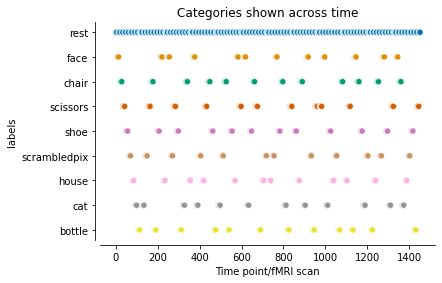

In [9]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

stimulus_annotations = pd.read_csv(haxby_dataset.session_target[0], delimiter=' ')

ax = sns.scatterplot(x=stimulus_annotations.index, y=stimulus_annotations['labels'], 
                     hue=stimulus_annotations['labels'], legend=False, palette='colorblind')
plt.title('Categories shown across time')
ax.set_xlabel('Time point/fMRI scan')
sns.despine(offset=5)

---

We have 8 different stimuli categories that are :  $\textbf{scissors, face, cat, scrambledpix, bottle, chair, shoe, house}$. 

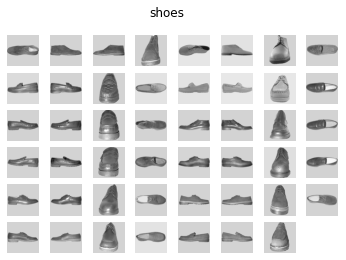

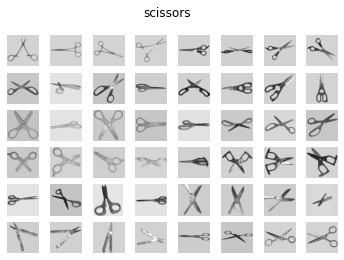

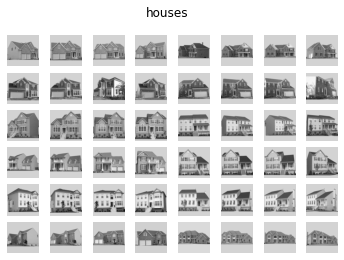

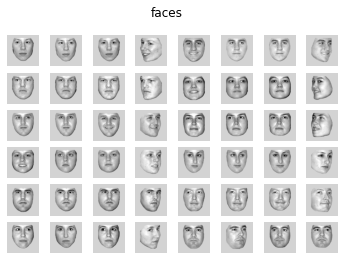

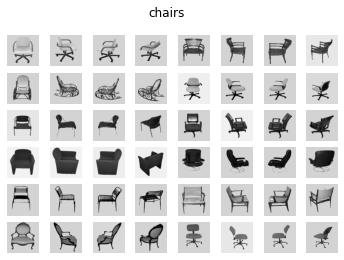

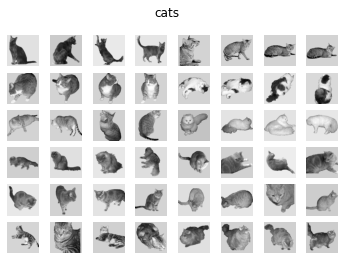

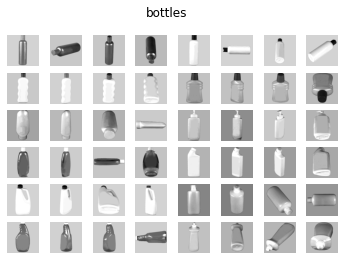

In [11]:
stimulus_information = haxby_dataset.stimuli

for stimulus_type in [*stimulus_information]:
    
    if stimulus_type != 'controls':

        img_paths = stimulus_information[stimulus_type]
        
        fig, axes = plt.subplots(6, 8)
        fig.suptitle(stimulus_type)

        for img_path, ax in zip(img_paths, axes.ravel()):
            image = plt.imread(img_path)
            ax.imshow(image, cmap='gray')

        for ax in axes.ravel():
            ax.axis("off")

plt.show()

The data includes several nii files, which contain images of brain volumes, either anatomical or functional scans, as well as (binary) masks. Let's `visualize` the anatomical image of subject's brain.

In [19]:
anat_image = load_img(haxby_dataset.anat)
print(anat_image.dataobj.shape)

(124, 256, 256, 1)


This is basically a numpy array that has the same dimensions as our image and the data reflect `values` for a given voxel.

The first three dimensions (124, 256, 256) represent the spatial dimensions of the fMRI data, indicating that the data consists of 124 slices, each of size 256 x 256 voxels. Each voxel represents a small volume of brain tissue that is imaged by the fMRI scanner.

The fourth dimension 1 represents the temporal dimension of the fMRI data, indicating that the data was acquired over a single time point. This means that the fMRI data represents a snapshot of brain activity at a particular moment in time.

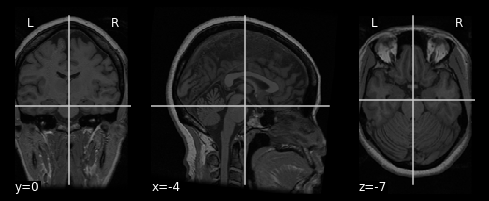

In [21]:
plotting.plot_anat(anat_image)

c:\Users\33433\anaconda3\lib\site-packages\numpy\core\fromnumeric.py:784: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
c:\Users\33433\anaconda3\lib\site-packages\nilearn\image\resampling.py:545: UserWarning: Casting data from int32 to float32
  warnings.warn("Casting data from %s to %s" % (data.dtype.name, aux))



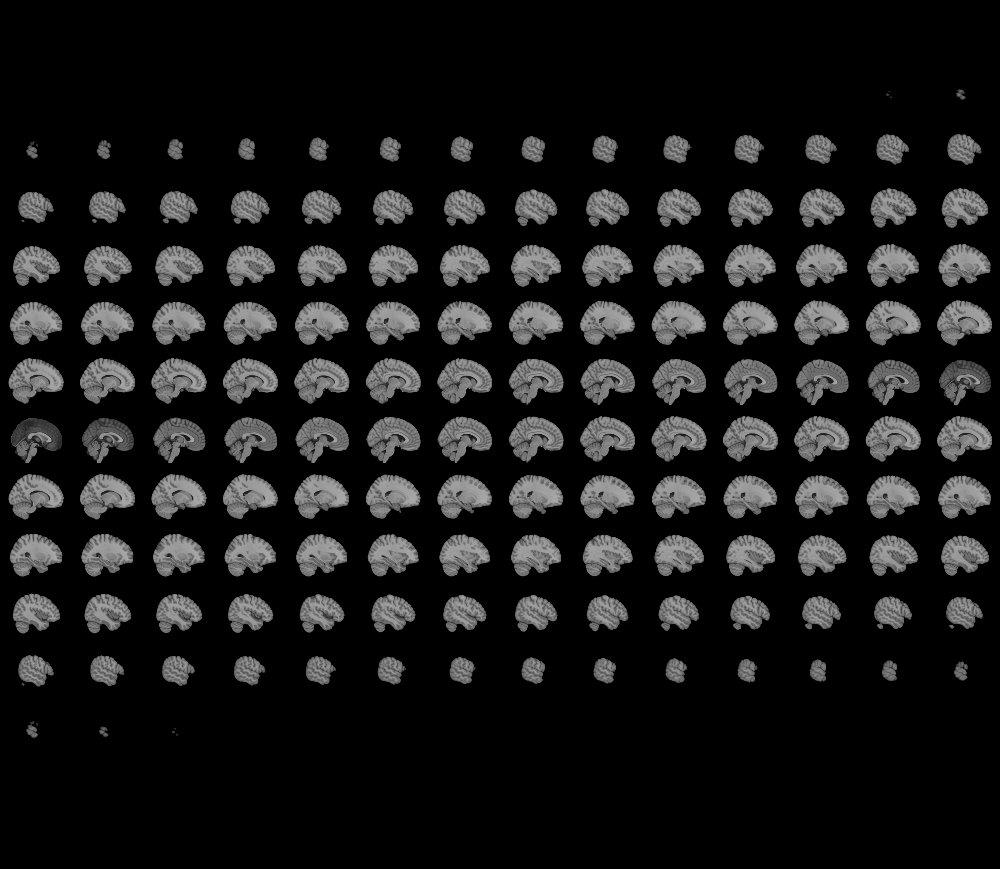
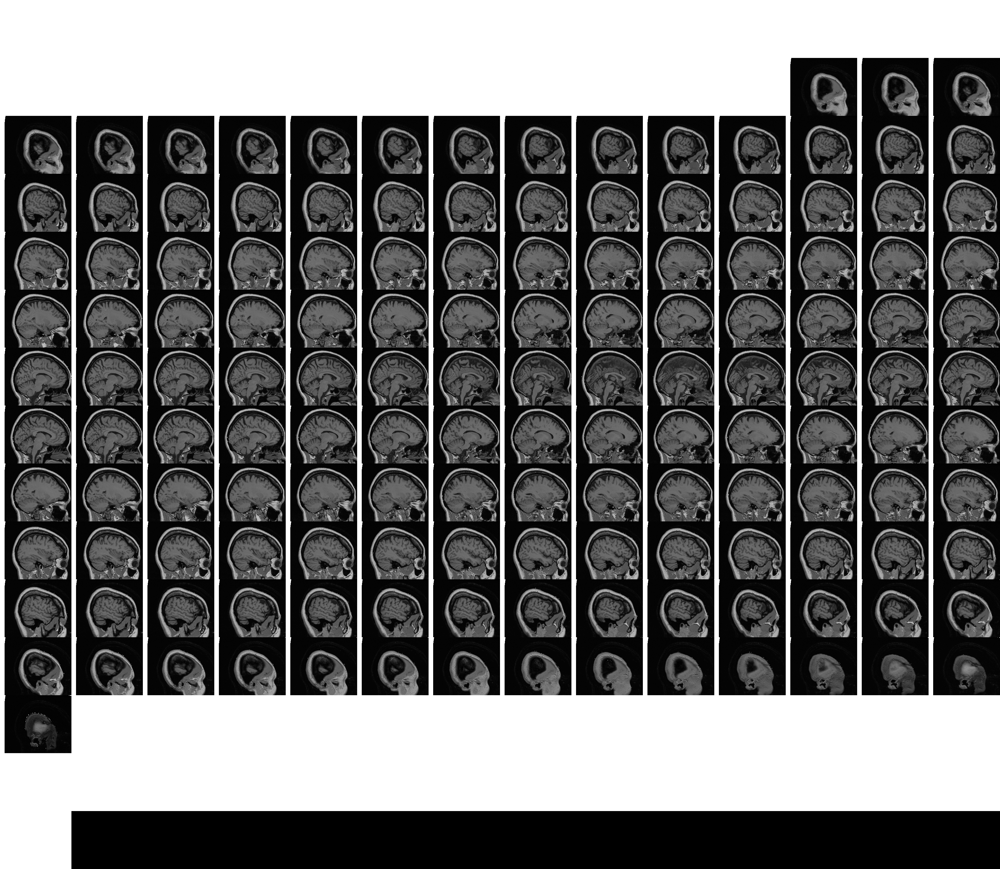

In [22]:
plotting.view_img(anat_image, symmetric_cmap=False, cmap='Greys_r', colorbar=False)

We can also do the same things with the `functional image`. Here, we discoverd that the temporal dimension enlarges to 1452, indicating that the data was acquired over 1452 time points. Each time point corresponds to a snapshot of brain activity.

In [24]:
func_image = load_img(haxby_dataset.func)
print(func_image.dataobj.shape)

(40, 64, 64, 1452)


As we have a 4D image, we can derive the mean image over time and plot that.

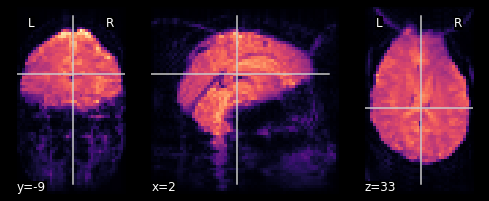

In [30]:
func_image_mean = mean_img(func_image)
plotting.plot_epi(func_image_mean, cmap='magma')

We finally visualize a binary mask named the ventral temporal cortex, which highligts a part of the brain specialized in the processing of visual information and contains area sensitive to different types of image categories. We will plot it as an overlay on the anatomica image.

In [38]:
vt_mask = load_img(haxby_dataset.mask_vt)
print(vt_mask.shape)

(40, 64, 64, 1)


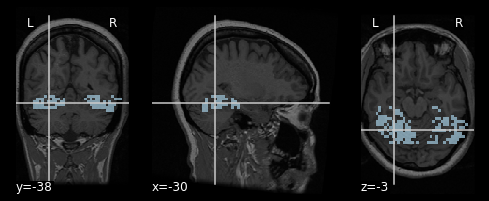

In [39]:
plotting.plot_roi(vt_mask, bg_img=anat_image, cmap='Paired')

#### 1.1 Brain Decoding

#### 1.2 

### Part 2: Preprocessing and Visualization

### Part 3: Functional Connectivity